# Imports

In [1]:
%matplotlib inline
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import pickle
import collections



# FUNCTIONS

## Camera Calibration

In [2]:
# CAMERA CALIBRATION
def get_camera_parameters():

    # Read in and make a list of calibration images
    images = glob.glob('camera_cal/calibration*.jpg')
    nx = 9 #The number of inside corners in x
    ny = 6 #The number of inside corners in y

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # prepare object points, like (0,0,0) , (1,0,0), ..., (7,5,0)
    objp = np.zeros((ny * nx, 3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2) # x, y coordinates


    for fname in images:
        img = mpimg.imread(fname)
        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        # If corners are found, add object points, image points
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)
        
            # Draw and display ALL the corners
            if debug == 2:
                cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
                plt.imshow(img)
                plt.show()
    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (img.shape[1], img.shape[0]), None, None)
    return mtx, dist

def img_undistort(img, mtx, dist):
    img_dst = cv2.undistort(img, mtx, dist, None, mtx)
    return img_dst


## Line Detection functions

In [3]:
# In this section there are various filters that I experimented with different combinations

def yellow_select(img):
    '''
    This function selects yellow pixels, in the HSV color space
    '''
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)    
    # HSV yellow limit values
    # H should be more strict
    yellow_min = np.array([15, 50, 50],np.uint8)
    yellow_max = np.array([40, 255, 255],np.uint8)

    # It is easier to  create zeroes outside wanted area
    #yellow_mask =  np.ones_like(img_hsv)
    yellow_masked =  np.copy(img_hsv)
    yellow_masked[  ((img_hsv[:,:,0]<yellow_min[0]) |  (img_hsv[:,:,0]>yellow_max[0]))
                | ((img_hsv[:,:,1]<yellow_min[1]) |  (img_hsv[:,:,1]>yellow_max[1]))
                | ((img_hsv[:,:,2]<yellow_min[2]) |  (img_hsv[:,:,1]>yellow_max[2]))
               ] = [0,0,0]

    return cv2.cvtColor(yellow_masked, cv2.COLOR_HSV2RGB)


def white_select(img):
    '''
    This function selects white pixels, in the HSV color space
    '''
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)    
    white_min = np.array([0, 0, 210],np.uint8)
    white_max = np.array([255, 40, 255],np.uint8)
    white_masked =  np.copy(img_hsv)
    white_masked[  ((img_hsv[:,:,0]<white_min[0]) |  (img_hsv[:,:,0]>white_max[0]))
                | ((img_hsv[:,:,1]<white_min[1]) |  (img_hsv[:,:,1]>white_max[1]))
                | ((img_hsv[:,:,2]<white_min[2]) |  (img_hsv[:,:,1]>white_max[2]))
               ] = [0,0,0]

    return cv2.cvtColor(white_masked, cv2.COLOR_HSV2RGB)

def colors_select(img):
    '''
    This function uses the white and  yellow pixel filters combined
    '''
    
    # Create filter
    yellow_masked = cv2.cvtColor(yellow_select(img),cv2.COLOR_RGB2GRAY)
    white_masked = cv2.cvtColor(white_select(img),cv2.COLOR_RGB2GRAY)
    colors_binary = np.zeros_like(yellow_masked)
    colors_binary[(yellow_masked > 0) | (white_masked > 0)] = 1 
    return colors_binary

    

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(100, 150)):   
    '''
    This function takes an image, gradient orientation,sobel kernel size and threshold min / max values.
    It returns a mask that has 1's where the directional magnitude is within the threshold limits.

    '''
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Already grayscale:
    #gray = img
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    grad_binary = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the binary image
    return grad_binary


def mag_thresh(img, sobel_kernel=3, mag_thresh=(30, 100)):
    '''
    This function takes an image, sobel kernel size and threshold values.
    It returns a mask that has 1's where the magnitude of gradient is within the threshold limits.
    '''
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Already grayscale:
    #gray = img    
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return mag_binary

# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3)):
    '''
    This function takes an image, sobel kernel size and threshold values of an angle in radians
    It returns a mask that has 1's where the magnitude of gradient is within the threshold limits.
    '''
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Already grayscale:
    #ray = img        
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply an angle threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    dir_binary =  np.zeros_like(absgraddir)
    dir_binary[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return dir_binary

def h_select(img, h_thresh=(80,90)):
    '''
    This function uses H channel of HLS color space for filtering 
    '''
    # care! h_threshold between 0 and 179
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    h_channel = hls[:,:,0]
    binary_output = np.zeros_like(h_channel)
    binary_output[(h_channel > h_thresh[0]) & (h_channel <= h_thresh[1])] = 1
    return binary_output

def s_select(img, s_thresh=(90,255)):
    '''
    This function uses S channel of HLS color space for filtering 
    '''
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]  
    binary_output = np.zeros_like(s_channel)   
    binary_output[(s_channel > s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    return binary_output

def hls_select(img, h_thresh=(0,179),s_thresh=(90, 255)):
    '''
    This function uses H and S channel of HLS color space for filtering 
    '''
    # care! h_threshold between 0 and 179
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    h_channel = hls[:,:,0]
    s_channel = hls[:,:,2]  
    h_select = np.zeros_like(s_channel)
    s_select = np.zeros_like(s_channel) 
    h_select[(h_channel > h_thresh[0]) & (h_channel <= h_thresh[1])] = 1
    s_select[(s_channel > s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    binary_output = np.zeros_like(s_channel)
    binary_output[((h_select == 1) | (s_select == 1))] = 1

    return binary_output

def detect_lines(img):
    '''
    This function combines various filters to achieve detection of white and yellow road lines
    '''
    
    # Choose a Sobel kernel size
    yellow_filter = yellow_select(img)
    white_filter = white_select(img)
    colors_filter = colors_select(img)
    s_filter = s_select(img)
    gradx_filter = abs_sobel_thresh(img, orient='x', sobel_kernel=7,thresh=(20, 255))
    grady_filter = abs_sobel_thresh(img, orient='y', sobel_kernel=7, thresh=(50, 255))
    mag_filter = mag_thresh(img, sobel_kernel=7,mag_thresh=(40, 200))
    dir_filter = dir_threshold(img, sobel_kernel=21, thresh=(0.7, 1.1))

    temp_filter1 = np.zeros_like(colors_filter)
    temp_filter1[( ((colors_filter == 1) |((gradx_filter == 1) & (grady_filter == 1)))
                 )] = 1
    
    temp_filter2 = np.zeros_like(colors_filter)
    temp_filter2[( ((mag_filter ==1)& (dir_filter==1))
                 )] = 1
    combined_filter = np.zeros_like(colors_filter)
    combined_filter[( ((colors_filter == 1) |((gradx_filter == 1) & (grady_filter == 1)))
                     | ((mag_filter == 1) & (dir_filter == 1))
                    )] = 1    
    if (debug == True):
        plt_compare(img, colors_filter,title2 = 'Yellow & White detection',color_out = False)
        plt_compare(img, temp_filter1,title2 = 'Color Detection & gradx, grady',color_out = False)
        plt_compare(img, temp_filter2,title2 = 'Magnitute of Gradient & Direction',color_out = False)
        plt_compare(img, combined_filter,title2 = 'Combined Filter',color_out = False)
        
    if (debug == 2):
        #plt.title('yellow_filter')
        #plt.imshow(yellow_filter)
        #plt.show()
        

        #plt.title('white_filter')
        #plt.imshow(white_filter)
        #plt.show()
        
        plt.title('colors_filter')
        plt.imshow(colors_filter)
        plt.show()
        
        #h_filter = hls_select(img)
        #plt.title('H_filter')
        #plt.imshow(h_filter)
        #plt.show()
        
        #plt.title('S_filter')
        #plt.imshow(s_filter)
        #plt.show()
        
        plt.title('gradx_filter')
        plt.imshow(gradx_filter)
        plt.show()
        
        plt.title('grady_filter')
        plt.imshow(grady_filter)
        plt.show()
        
        plt.title('temp_filter1')    
        plt.imshow(temp_filter1)
        plt.show()
        
        plt.title('mag_filter')
        plt.imshow(mag_filter)
        plt.show()
        
        plt.title('dir_filter')    
        plt.imshow(dir_filter)
        plt.show()
        
        plt.title('temp_filter2')    
        plt.imshow(temp_filter2)
        plt.show()
        
        plt.title('combined_filter')    
        plt.imshow(combined_filter)
        plt.show()        

    return combined_filter

## Perspective Transform

In [4]:
def perspective_transform(img):
    '''
    This function transforms the perspective from a normal to a warped image.
    The matrix is based on manual selection of points
    '''
    
    src_xy = np.float32(
        [[577,460],  # top left
         [704,460],  # top right
         [1050,677],  # bottom right
         [250,677]])  # bottom left  

    dst_xy = np.float32(
        [[240, 0],  # top left
         [1040,0],  # top right
         [1040,720],  # bottom right
         [240,720]])  # bottom left   
    img_size = (img.shape[1], img.shape[0])
    
    M = cv2.getPerspectiveTransform(src_xy, dst_xy)
    M_inv = cv2.getPerspectiveTransform(dst_xy, src_xy)
    
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, M, M_inv 

def rev_perspective_transform(img, M_inv):
    '''
    This function reverses the warped image back to the original
    '''    
    img_size = (img.shape[1], img.shape[0])
    unwarped = cv2.warpPerspective(img, M_inv, img_size, flags=cv2.INTER_LINEAR)
    return unwarped
        

In [5]:
def fit_lines(binary_warped):
    '''
    This function calculates 2nd order polynomial lines out of the detected line points of the warped image.
    The function also calculates the curvature of the lane and offset from center of the line.
    '''
    
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set the width of the windows +/- margin
    margin = 100
    
    # Set minimum number of pixels found to recenter window
    minpix = 50
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 20 / 720 # meters per pixel in y dimension
    xm_per_pix = 3.7 / 700 # meters per pixel in x dimension    
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]    

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)

    # Calculate the new radii of curvature
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    avg_curv =  (left_curverad+right_curverad)/2

    
    # Calculate deviation from the center of the frame, use the 10% of nearest pixels in bottom
    left_x_bottom = np.mean(leftx[lefty > 0.9*lefty.max()])
    right_x_bottom = np.mean(rightx[righty > 0.9*righty.max()])
    lane_width = right_x_bottom - left_x_bottom
    offset_px = ((left_x_bottom + lane_width / 2) - binary_warped.shape[1]/2)
    offset = offset_px *xm_per_pix
   
    
    if (debug==True): 
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        tmp_fig = plt.figure(figsize=(16,9),dpi=80) 
        tmp_ax = tmp_fig.add_axes([0, 0, 1, 1])
        tmp_ax.axis('off')
        tmp_ax.imshow(out_img)        
        tmp_ax.plot(left_fitx, ploty, color='yellow')
        tmp_ax.plot(right_fitx, ploty, color='yellow')
        #plt.plot(left_fitx, ploty, color='yellow')
        #plt.plot(right_fitx, ploty, color='yellow')
        #plt.xlim(0, 1280)
        #plt.ylim(720, 0)
        plt.savefig('output_images/lines_detected.png', dpi=80)
    
    
    return avg_curv, offset, left_fit, right_fit

In [6]:
def fast_fit_lines(binary_warped, left_fit, right_fit):
    '''
    This function calculates 2nd order polynomial lines out of the detected line points of the warped image.
    The function searches only near the already fitted left and right lines from the previous image
    The function also calculates the curvature of the lane and offset from center of the line.
    '''
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 20 / 720 # meters per pixel in y dimension
    xm_per_pix = 3.7 / 700 # meters per pixel in x dimension    
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
        
    # Calculate the new radii of curvature
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    avg_curv =  (left_curverad+right_curverad)/2

    # Calculate deviation from the center of the frame, use the 10% of nearest pixels in bottom
    left_x_bottom = np.mean(leftx[lefty > 0.9*lefty.max()])
    right_x_bottom = np.mean(rightx[righty > 0.9*righty.max()])
    lane_width = right_x_bottom - left_x_bottom
    offset_px = ((left_x_bottom + lane_width / 2) - binary_warped.shape[1]/2)
    offset = offset_px *xm_per_pix
       
    if (debug==True):    
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        
    return avg_curv, offset, left_fit, right_fit

In [7]:
def draw_lane(image,M_inv, left, right):
    '''
    This function draws a green lane onto the input unwrapped, undistorted image.

    '''    
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0] )
    left_fit = left
    right_fit = right
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(image[:,:,0]).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
  
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    #plt.imshow(color_warp)
    #plt.show()
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    #newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    newwarp = rev_perspective_transform(color_warp, M_inv)
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    
    return result


In [8]:
def process_img(img):
    '''
    This is the image processing pipeline

    '''   
    # I am using 2 global variables to store the coefficients of the previously detected lines
    global global_left_fit
    global global_right_fit    
    
    # Undistort the image, based on the calibration features of the camera
    img_dst = img_undistort(img, mtx, dist)
    
    # Detect the white and yellow pixels in the image; mostly these should be parts of the driving lines
    img_binary = detect_lines(img_dst)
    
    # Transform the image into "birdeye" view
    img_binary_wraped, M, M_inv = perspective_transform(img_binary)
    
    # Calculate the polynomial left and right lane lines, the curve of the lane and the offset from the center of the lane
    if global_left_fit is not None and global_right_fit is not None:
        avg_curv, offset, left_fit, right_fit  = fast_fit_lines(img_binary_wraped, global_left_fit, global_right_fit)
    else:
        avg_curv, offset, left_fit, right_fit = fit_lines(img_binary_wraped)
    
    # Transfer the left and right line coefficients to the next frame, for faster calculation
    global_left_fit = left_fit
    global_right_fit = right_fit
    
    # Draw the lane
    drawn_lane = draw_lane(img_dst,M_inv, global_left_fit, global_right_fit)
    
    # Overlay the curvature and offset in the image 
    output_curvature = cv2.putText(drawn_lane, "Radius of Curvature = " + str(int(avg_curv)) + "m", (20, 100), cv2.FONT_HERSHEY_PLAIN, 2, (255, 0, 0), 2)
    if offset < 0:
        output_road_pos = cv2.putText(output_curvature, "Vehicle is: {0:.2f}m right of center".format(-offset), (20, 200), cv2.FONT_HERSHEY_PLAIN, 2, [0, 255, 0], 2)
    else:
        output_road_pos = cv2.putText(output_curvature, "Vehicle is: {0:.2f}m left of center".format(offset), (20, 200), cv2.FONT_HERSHEY_PLAIN, 2, [0, 255, 0], 2)

    return output_road_pos    

In [9]:
def plt_compare(img1, img2, title1 = 'Original Image', title2 = 'Processed Image', color_in = True, color_out = True):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 15))
    f.tight_layout()
    if color_in & color_out:
        ax1.imshow(img1)
        ax1.set_title(title1, fontsize=50)
        ax2.imshow(img2)
        ax2.set_title(title2, fontsize=50)
        return  plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    if color_in & (not color_out):
        ax1.imshow(img1)
        ax1.set_title(title1, fontsize=50)
        ax2.imshow(img2, cmap = 'gray')
        ax2.set_title(title2, fontsize=50)
        return  plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    if (not color_in) & color_out:
        ax1.imshow(img1, cmap = 'gray')
        ax1.set_title(title1, fontsize=50)
        ax2.imshow(img2)
        ax2.set_title(title2, fontsize=50)
        return  plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    else:
        ax1.imshow(img1, cmap = 'gray')
        ax1.set_title(title1, fontsize=50)
        ax2.imshow(img2, cmap = 'gray')
        ax2.set_title(title2, fontsize=50)
        return  plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
def save_single(img,name):
    tmp_fig = plt.figure(figsize=(16,9),dpi=80) 
    tmp_ax=tmp_fig.add_axes([0, 0, 1, 1])
    tmp_ax.axis('off')
    tmp_ax.imshow(img)
    tmp_fig.savefig(name, dpi=80)

# ADVANCED LANE LINES

# Camera Calibration

In [10]:
# Calculate camera calibration parameters
debug = 0
mtx, dist = get_camera_parameters()

### Calibration sample

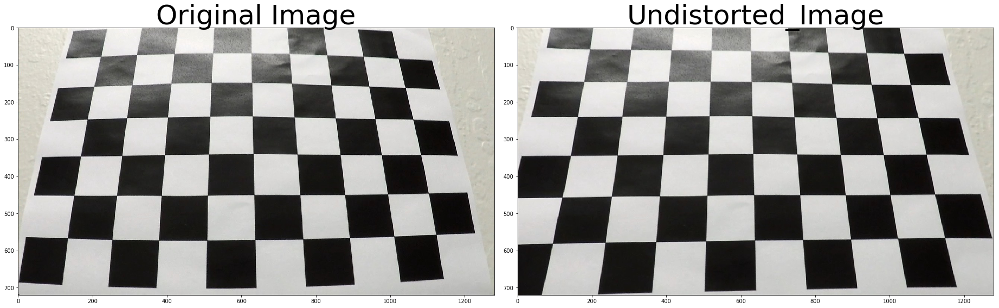

In [11]:
tmp_img = mpimg.imread('camera_cal/calibration3.jpg')
plt_compare(tmp_img, img_undistort(tmp_img, mtx, dist),'Original Image', 'Undistorted_Image')


# Pipeline Single Image

## Undistortion

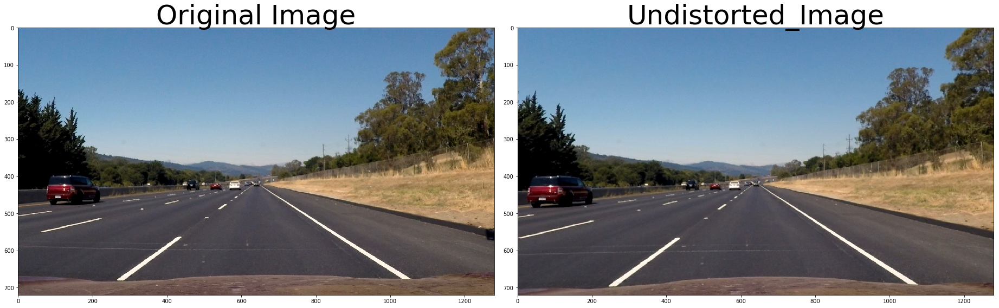

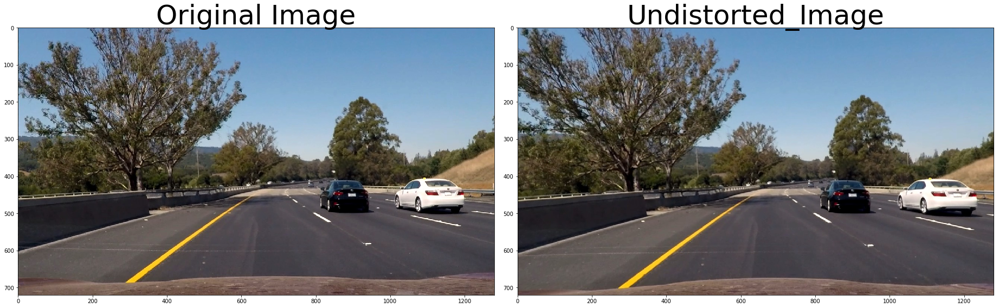

In [12]:
# Undistorted
tmp_img = mpimg.imread('test_images/straight_lines2.jpg')
plt_compare(tmp_img, img_undistort(tmp_img, mtx, dist),title2 = 'Undistorted_Image')

tmp_img = mpimg.imread('test_images/test6.jpg')
plt_compare(tmp_img, img_undistort(tmp_img, mtx, dist),title2 =  'Undistorted_Image')


## Line Detection Filters

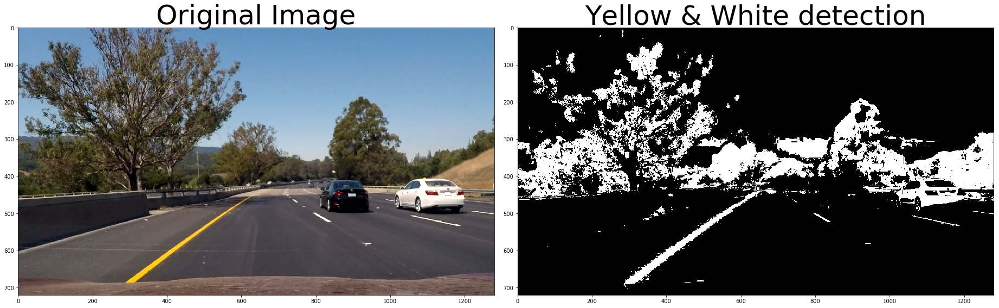

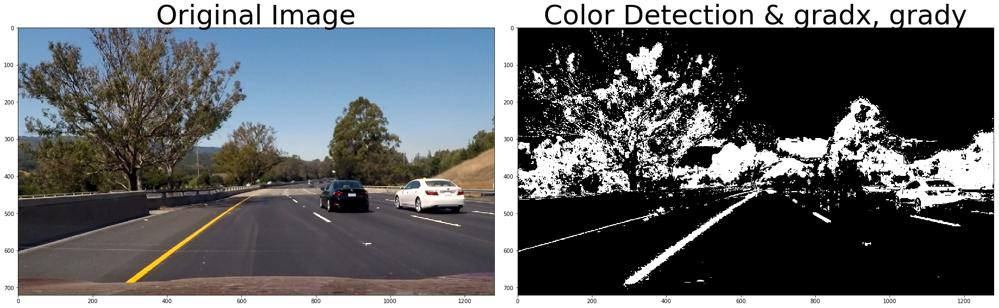

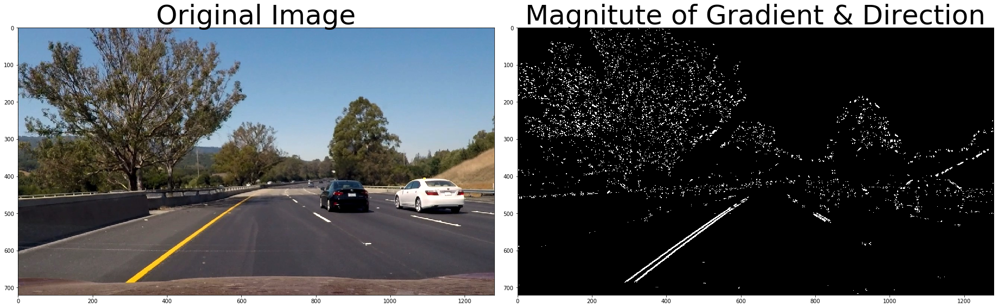

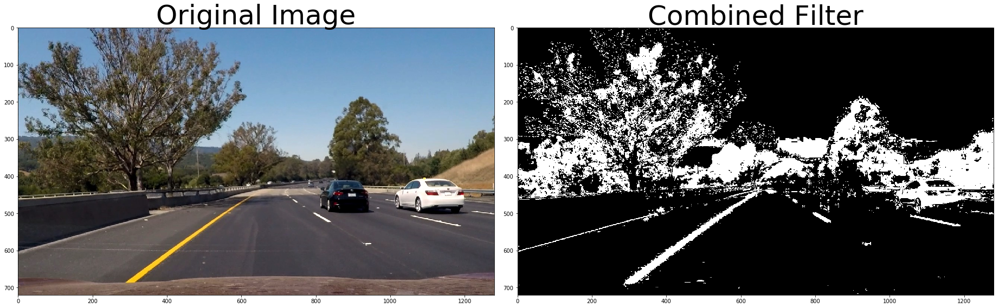

In [13]:
debug = 1
tmp_img = mpimg.imread('test_images/test6.jpg')
detect_lines(tmp_img)
debug = 0

## Perspective Transform

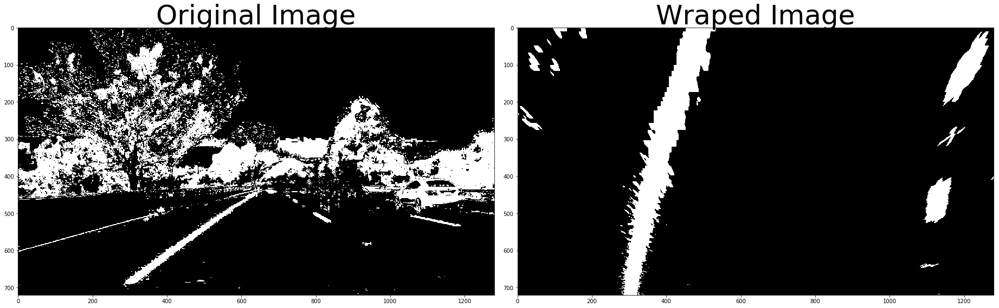

In [14]:
debug = 0
tmp_img_binary_wraped, tmp_M, tmp_M_inv = perspective_transform(detect_lines(tmp_img))
plt_compare(detect_lines(tmp_img), tmp_img_binary_wraped,title2= 'Wraped Image', color_in = False, color_out = False)



## Line detection and polynomial calculation

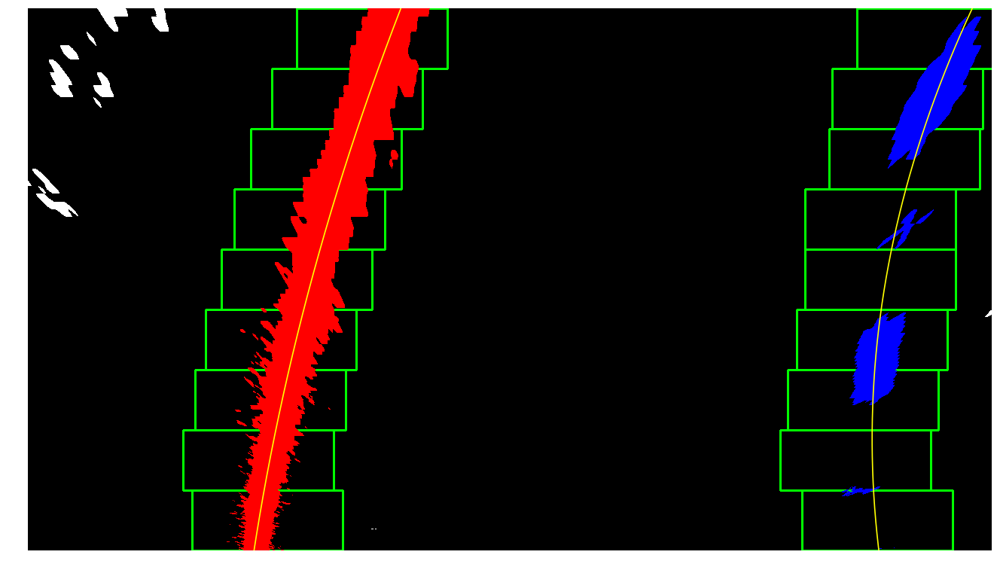

In [15]:
global_left_fit = None
global_right_fit = None
debug = 1
avg_curv, offset, left_fit, right_fit  = fit_lines(tmp_img_binary_wraped)
global_left_fit = None
global_right_fit = None
debug = 0

## Lane creation and Curvature and offset overlay creation

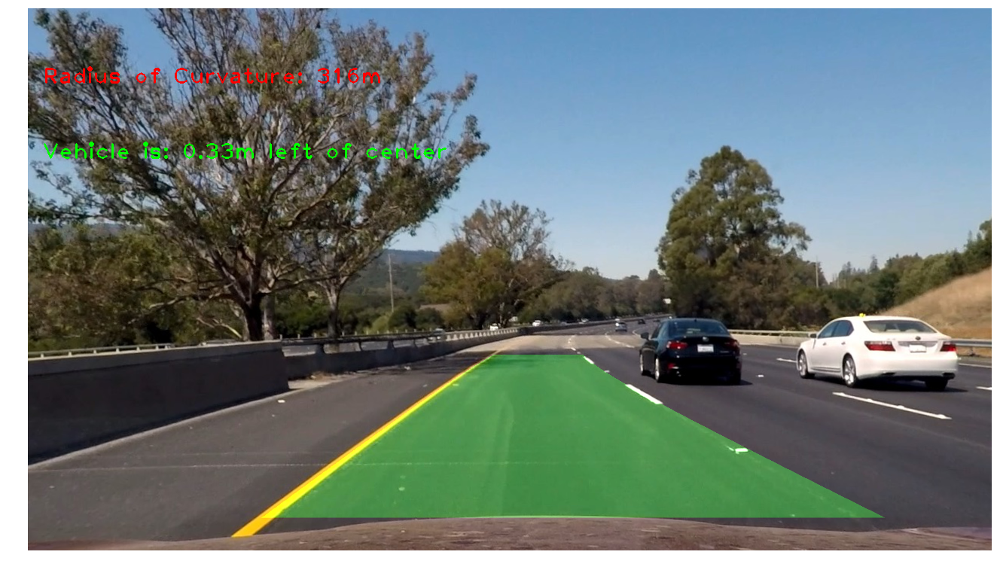

In [16]:
tmp_drawn_lane = draw_lane(img_undistort(tmp_img,mtx, dist),tmp_M_inv, left_fit, right_fit)
tmp_drawn_lane = cv2.putText(tmp_drawn_lane, "Radius of Curvature: " + str(int(avg_curv)) + "m", (20, 100), cv2.FONT_HERSHEY_PLAIN, 2, (255, 0, 0), 2)
if offset < 0:
    tmp_drawn_lane = cv2.putText(tmp_drawn_lane, "Vehicle is: {0:.2f}m right of center".format(-offset), (20, 200), cv2.FONT_HERSHEY_PLAIN, 2, [0, 255, 0], 2)
else:
    tmp_drawn_lane = cv2.putText(tmp_drawn_lane, "Vehicle is: {0:.2f}m left of center".format(offset), (20, 200), cv2.FONT_HERSHEY_PLAIN, 2, [0, 255, 0], 2)
save_single(tmp_drawn_lane,'output_images/test6_lane.png')


# RUN Pipeline for video production

In [17]:
from moviepy.editor import VideoFileClip
debug = 0
global_left_fit = None
global_right_fit = None

project_output_file = "project4_output.mp4"
project_video = VideoFileClip("project_video.mp4")

project_output = project_video.fl_image(process_img)
%time project_output.write_videofile(project_output_file, audio=False)

[MoviePy] >>>> Building video project_output.mp4
[MoviePy] Writing video project_output.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [06:30<00:00,  3.32it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_output.mp4 

Wall time: 6min 31s
